In [1]:
!pip install torch torchvision

In [2]:
import json
import os
import random
import zipfile
import torch
import csv
import math
import io

import torch.nn as nn
import pandas as pd
import numpy as np
import torchvision.models as models
import torchvision.transforms as T
import matplotlib.pyplot as plt
import matplotlib.patches as patches
import matplotlib.image as mpimg

from collections import defaultdict
from itertools import combinations
from PIL import Image, ImageOps
from torch.utils.data import Dataset, DataLoader
from torchvision import transforms
from torchvision.transforms import functional as TF
from google.colab import drive

In [3]:
drive.mount('/content/drive')
json_path = "/content/drive/MyDrive/AI_Article/Jsons/26-11-2025_11-45_PASTANE.json"
photo_path = "/content/drive/MyDrive/AI_Article/Datasets/Embedding_Photos"
augmented_photo_path  = "/content/drive/MyDrive/AI_Article/Datasets/Augmented_Photos"
test_photo_path1 = "/content/drive/MyDrive/AI_Article/Test_Photos/test1.png"
test_photo_path2 = "/content/drive/MyDrive/AI_Article/Test_Photos/test2.png"
test_photo_path3 = "/content/drive/MyDrive/AI_Article/Test_Photos/test3.png"
test_photo_path4 = "/content/drive/MyDrive/AI_Article/Test_Photos/test4.png"

Mounted at /content/drive


{'Crop Number': 717, 'Region Number': 165, 'Max Crop Number of a Region': 10, 'Min Crop Number of a Region': 2}


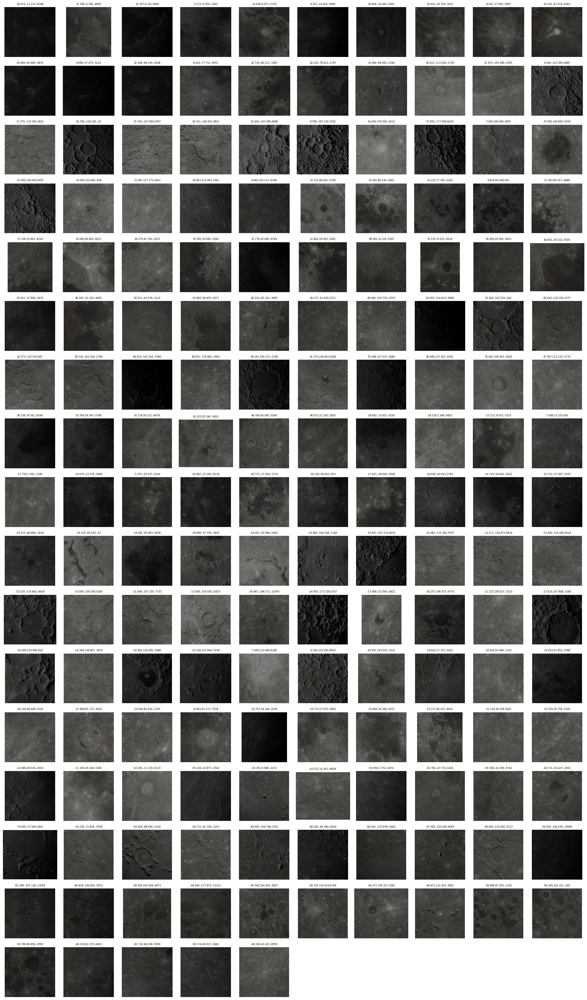

In [ ]:
# REGION CONTROLS

with open(json_path, "r", encoding="utf-8") as f:
    data = json.load(f)

region_groups = defaultdict(list)
total_regions = 0

for item in data["_via_img_metadata"].values():
    fname = item["filename"]

    for region in item.get("regions", []):

        total_regions += 1
        attr = region.get("region_attributes", {})
        sa   = region.get("shape_attributes", {})

        lat = str(attr.get("Latitude", "")).strip()
        lon = str(attr.get("Longitude", "")).strip()
        alt = str(attr.get("Altitude", "")).strip()

        if not (lat and lon and alt):
            continue

        x = sa.get("x")
        y = sa.get("y")
        w = sa.get("width")
        h = sa.get("height")

        if None in (x, y, w, h):
            continue

        key = f"{lat},{lon},{alt}"

        region_groups[key].append({
            "fname": fname,
            "x": x,
            "y": y,
            "w": w,
            "h": h,
        })

summary = {
    "Crop Number": total_regions,
    "Region Number": len(region_groups),
    "Max Crop Number of a Region": max((len(v) for v in region_groups.values()), default=0),
    "Min Crop Number of a Region": min((len(v) for v in region_groups.values()), default=0)
}

print(summary)


region_keys = list(region_groups.keys())
max_show = min(len(region_groups), len(region_keys))
region_keys = region_keys[:max_show]

cols = 10
rows = math.ceil(len(region_keys) / cols)

fig, axes = plt.subplots(rows, cols, figsize=(2*cols, 2*rows))
axes = axes.flatten()

for i, key in enumerate(region_keys):
    info = random.choice(region_groups[key])
    fname = info["fname"]
    x, y, w, h = info["x"], info["y"], info["w"], info["h"]

    img_path = os.path.join(photo_path, fname)
    img = Image.open(img_path).convert("RGB")

    crop = img.crop((x, y, x + w, y + h))

    axes[i].imshow(crop)
    axes[i].set_title(key, fontsize=6)
    axes[i].axis("off")

for j in range(i + 1, len(axes)):
    axes[j].axis("off")

plt.tight_layout()
plt.show()


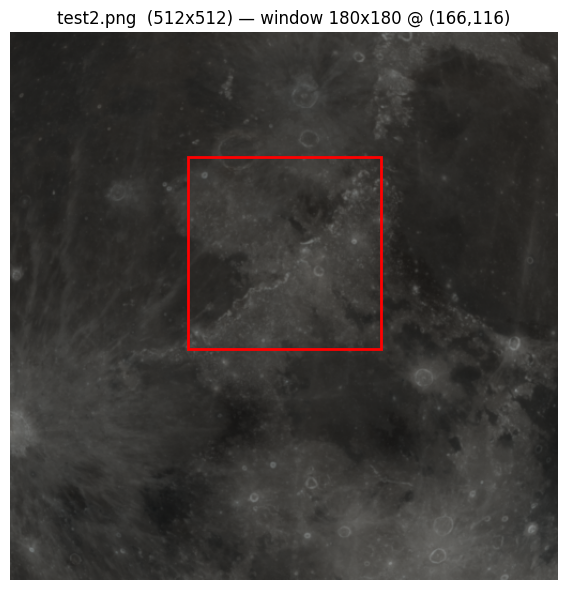

In [5]:
# WINDOW SIZE DECISION

WIN = 180
img = Image.open(test_photo_path2).convert("RGB")
W, H = img.size
x = (W - WIN) // 2
y = (H - WIN) // 2 - 50

fig, ax = plt.subplots(figsize=(6,6))
ax.imshow(img)
rect = patches.Rectangle((x, y), WIN, WIN, linewidth=2, edgecolor='r', facecolor='none')
ax.add_patch(rect)
ax.set_title(f"test2.png  ({W}x{H}) — window {WIN}x{WIN} @ ({x},{y})")
ax.axis("off")
plt.tight_layout()
plt.show()

In [ ]:
# ROTATION AUGMENTATION

csv_path = os.path.join(augmented_photo_path, "index.csv")

ANGLE_STEP = 30
ANGLE_LIST = list(range(0, 360, ANGLE_STEP))

TARGET_SIZE = (224, 224)
mean = [0.485, 0.456, 0.406]
std  = [0.229, 0.224, 0.225]
FILL = tuple(int(round(m*255)) for m in mean)

RESAMPLE = Image.BICUBIC
MODE_LABEL = "keep_scale_mean"

os.makedirs(augmented_photo_path, exist_ok=True)

with open(json_path, "r", encoding="utf-8") as f:
    data = json.load(f)

coord_map = {}
stem_to_filename = {}

for item in data["_via_img_metadata"].values():
    fn = item["filename"]
    stem_to_filename[os.path.splitext(fn)[0]] = fn

    for r in item.get("regions", []):
        attr = r.get("region_attributes", {})
        lat = str(attr.get("Latitude","")).strip()
        lon = str(attr.get("Longitude","")).strip()
        alt = str(attr.get("Altitude","")).strip()
        if not (lat and lon and alt):
            continue
        sh = r.get("shape_attributes", {})
        coord_map[(fn, lat, lon, alt)] = (
            sh.get("x"), sh.get("y"), sh.get("width"), sh.get("height")
        )

def square_pad(img, fill=(0,0,0)):
    w, h = img.size
    if w == h:
        return img
    size = max(w, h)
    pad = ((size-w)//2, (size-h)//2, (size-w)-(size-w)//2, (size-h)-(size-h)//2)
    return ImageOps.expand(img, border=pad, fill=fill)

def rotate_keep_scale(img, angle_deg, fill=(0,0,0)):
    w, h = img.size
    S = max(w, h)
    diag = int(math.ceil(math.sqrt(2) * S))
    pad_w, pad_h = diag - w, diag - h
    pad = (pad_w//2, pad_h//2, pad_w - pad_w//2, pad_h - pad_h//2)
    big = ImageOps.expand(img, border=pad, fill=fill)
    rot = big.rotate(angle_deg, resample=RESAMPLE, expand=False, fillcolor=fill)
    return rot

existing_files = [f for f in os.listdir(augmented_photo_path) if f.lower().endswith(".png") and "__rot" in f]
existing_set = set(existing_files)

rows_by_name = {}

def parse_aug_filename(fname):
    name = os.path.splitext(fname)[0]
    parts = name.split("__")
    if len(parts) != 3 or not parts[2].startswith("rot"):
        return None
    stem = parts[0]
    lla = parts[1].split("_")
    if len(lla) != 3:
        return None
    lat, lon, alt = lla
    try:
        angle = int(parts[2][3:])
    except:
        return None
    src_fn = stem_to_filename.get(stem, stem + ".png")
    return src_fn, lat, lon, alt, angle

for f in existing_files:
    parsed = parse_aug_filename(f)
    if parsed is None:
        continue
    src_fn, lat, lon, alt, angle = parsed
    x, y, w, h = coord_map.get((src_fn, lat, lon, alt), (None, None, None, None))
    rows_by_name[f] = [f, src_fn, lat, lon, alt, angle, x, y, w, h, MODE_LABEL]

created = 0
visited_regions = 0

for item in data["_via_img_metadata"].values():
    filename = item["filename"]
    img_path = os.path.join(photo_path, filename)
    if not os.path.exists(img_path):
        print(f"[WARN] Görsel yok: {img_path}")
        continue

    try:
        base_img = Image.open(img_path).convert("RGB")
    except Exception as e:
        print(f"[WARN] Açılamadı: {img_path} -> {e}")
        continue

    for r in item.get("regions", []):
        attr = r.get("region_attributes", {})
        sh   = r.get("shape_attributes", {})
        lat  = str(attr.get("Latitude","")).strip()
        lon  = str(attr.get("Longitude","")).strip()
        alt  = str(attr.get("Altitude","")).strip()
        if not (lat and lon and alt):
            continue
        x, y, w, h = sh.get("x"), sh.get("y"), sh.get("width"), sh.get("height")
        if None in (x,y,w,h):
            continue

        crop = base_img.crop((x, y, x+w, y+h))
        crop_sq = square_pad(crop, fill=FILL)

        stem = os.path.splitext(filename)[0]
        safe_lat = lat.replace(" ", "_")
        safe_lon = lon.replace(" ", "_")
        safe_alt = alt.replace(" ", "_")

        for angle in ANGLE_LIST:
            out_name = f"{stem}__{safe_lat}_{safe_lon}_{safe_alt}__rot{angle:03d}.png"
            out_path = os.path.join(augmented_photo_path, out_name)

            if out_name in existing_set:
                if out_name not in rows_by_name:
                    rows_by_name[out_name] = [out_name, filename, lat, lon, alt, angle, x, y, w, h, MODE_LABEL]
                continue

            aug_img = rotate_keep_scale(crop_sq, angle, fill=FILL)
            aug_img = aug_img.resize(TARGET_SIZE, RESAMPLE)
            aug_img.save(out_path)
            existing_set.add(out_name)
            rows_by_name[out_name] = [out_name, filename, lat, lon, alt, angle, x, y, w, h, MODE_LABEL]
            created += 1

        visited_regions += 1

print(f"Ziyaret edilen region: {visited_regions} | Yeni oluşturulan dosya: {created} | Mevcut bulunan: {len(existing_files)}")

rows = [rows_by_name[k] for k in sorted(rows_by_name.keys())]

with open(csv_path, "w", newline="", encoding="utf-8") as f:
    w = csv.writer(f)
    w.writerow(["aug_file","source_file","lat","lon","alt","angle_deg",
                "src_x","src_y","src_w","src_h","mode"])
    w.writerows(rows)

print(f"CSV kayıt: {csv_path} | Satır sayısı: {len(rows)}")


Ziyaret edilen region: 716 | Yeni oluşturulan dosya: 0 | Mevcut bulunan: 8508
CSV kayıt: /content/drive/MyDrive/AI_Article/Datasets/Augmented_Photos/index.csv | Satır sayısı: 8508


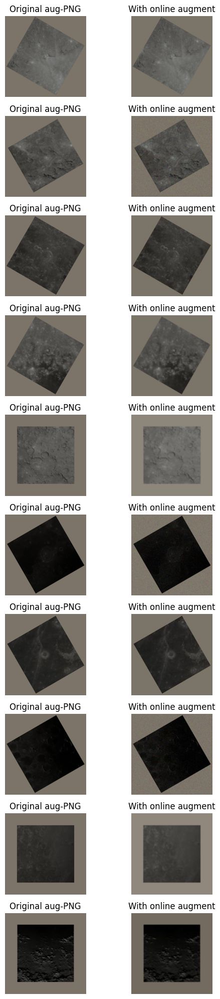

In [ ]:
# CUSTOM AUGMENTATION

class AddGaussianNoise(object):
    def __init__(self, mean=0.0, std=0.01):
        self.mean = mean
        self.std  = std

    def __call__(self, tensor):
        noise = torch.randn_like(tensor) * self.std + self.mean
        out = tensor + noise
        return torch.clamp(out, 0.0, 1.0)

    def __repr__(self):
        return f"{self.__class__.__name__}(mean={self.mean}, std={self.std})"


class JPEGCompression(object):
    def __init__(self, quality_range=(60, 95)):
        self.quality_range = quality_range

    def __call__(self, img):
        q = random.randint(self.quality_range[0], self.quality_range[1])
        buffer = io.BytesIO()
        img.save(buffer, format="JPEG", quality=q)
        buffer.seek(0)
        img_jpeg = Image.open(buffer).convert("RGB")
        return img_jpeg

    def __repr__(self):
        return f"{self.__class__.__name__}(quality_range={self.quality_range})"


class SmallGammaJitter(nn.Module):
    def __init__(self, gamma_range=(0.9, 1.1), gain=1.0):
        super().__init__()
        self.gamma_range = gamma_range
        self.gain = gain

    def forward(self, img):
        gamma = random.uniform(*self.gamma_range)
        return TF.adjust_gamma(img, gamma=gamma, gain=self.gain)


inv_mean = [-m/s for m, s in zip(mean, std)]
inv_std  = [1.0/s for s in std]
inv_normalize = transforms.Normalize(mean=inv_mean, std=inv_std)

def preview_aug_examples(csv_path, n=5):
    df = pd.read_csv(csv_path)

    samples = df.sample(n=min(n, len(df)), random_state=42)

    plt.figure(figsize=(6, 2*n))

    for i, (_, row) in enumerate(samples.iterrows()):
        pth = row["a_path"]
        pil_img = Image.open(pth).convert("RGB")

        ax1 = plt.subplot(n, 2, 2*i+1)
        ax1.imshow(pil_img)
        ax1.axis("off")
        ax1.set_title("Original aug-PNG")

        t = tf_embed(pil_img)
        t_denorm = inv_normalize(t).clamp(0, 1)
        aug_np = t_denorm.permute(1,2,0).cpu().numpy()

        ax2 = plt.subplot(n, 2, 2*i+2)
        ax2.imshow(aug_np)
        ax2.axis("off")
        ax2.set_title("With online augment")

    plt.tight_layout()
    plt.show()

mean = [0.485, 0.456, 0.406]
std  = [0.229, 0.224, 0.225]

tf_embed = transforms.Compose([
    transforms.Resize((224, 224)),

    transforms.RandomApply(
        [SmallGammaJitter(gamma_range=(0.7, 1.3), gain=1.0)],
        p = 0.3
    ),

    transforms.RandomApply(
        [transforms.GaussianBlur(kernel_size=3, sigma=(0.5,1))],
        p = 0.3
    ),

    transforms.RandomApply(
        [JPEGCompression(quality_range=(70, 80))],
        p = 0.3
    ),

    transforms.ToTensor(),

    transforms.RandomApply(
        [AddGaussianNoise(mean=0.0, std=0.03)],
        p = 0.3
    ),

    transforms.Normalize(mean=mean, std=std),
])


triplet_csv_path = "/content/drive/MyDrive/AI_Article/Datasets/Augmented_Photos/triplets.csv"

preview_aug_examples(triplet_csv_path, n=10)

Toplam key sayısı: 165
Train key sayısı: 165
Val key sayısı: 165
Test key sayısı: 165
Train örnek sayısı: 5672
Val örnek sayısı: 1418
Test örnek sayısı: 1418
Train triplet sayısı: 3300
Val triplet sayısı:   3298
Test triplet sayısı:  3295
triplets_train.csv zaten var, ÜZERİNE YAZMADIM: /content/drive/MyDrive/AI_Article/Datasets/Augmented_Photos/triplets_train.csv
triplets_val.csv zaten var, ÜZERİNE YAZMADIM: /content/drive/MyDrive/AI_Article/Datasets/Augmented_Photos/triplets_val.csv
triplets_test.csv zaten var, ÜZERİNE YAZMADIM: /content/drive/MyDrive/AI_Article/Datasets/Augmented_Photos/triplets_test.csv


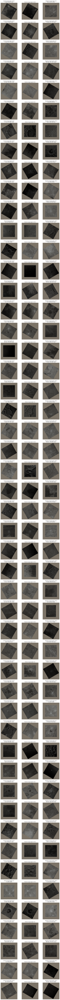

Kayıt edildi: /content/drive/MyDrive/AI_Article/Datasets/Augmented_Photos/triplets_preview_10.png


In [ ]:
# TRIPLET GENERATION AND SHOW

csv_aug_path           = os.path.join(augmented_photo_path, "index.csv")
triplet_train_csv_path = os.path.join(augmented_photo_path, "triplets_train.csv")
triplet_val_csv_path   = os.path.join(augmented_photo_path, "triplets_val.csv")
triplet_test_csv_path  = os.path.join(augmented_photo_path, "triplets_test.csv")
OUTPUT_FIG             = os.path.join(augmented_photo_path, "triplets_preview_10.png")

SEED = 42
POS_PER_KEY    = 10
NEG_PER_AP     = 2
MIN_ANGLE_DIFF = 60

N_TRIPLETS = 50
ENFORCE_UNIQUE_KEYS = True
RANDOM_SEED = 42
TARGET_SIZE = (224, 224)
OVERWRITE_TRIPLETS = False

random.seed(SEED)

df_aug = pd.read_csv(csv_aug_path)

for c in ["lat","lon","alt"]:
    df_aug[c] = df_aug[c].astype(str).str.strip()

df_aug = df_aug.rename(columns={"aug_file":"file"})
df_aug["path"] = df_aug["file"].apply(
    lambda f: os.path.join(augmented_photo_path, f)
)
df_aug["source"] = "aug"
df_aug["key"] = df_aug["lat"] + "," + df_aug["lon"] + "," + df_aug["alt"]

df_aug = df_aug[df_aug["path"].apply(os.path.exists)].reset_index(drop=True)

if "angle_deg" in df_aug.columns:
    def _to_float(x):
        try:
            return float(x)
        except:
            return None
    df_aug["angle_deg"] = df_aug["angle_deg"].apply(_to_float)
else:
    df_aug["angle_deg"] = None

random.seed(SEED)

train_rows = []
val_rows   = []
test_rows  = []

for key, g_key in df_aug.groupby("key"):
    for sf, g_sf in g_key.groupby("source_file"):
        g_sf = g_sf.sample(frac=1.0, random_state=SEED)

        n = len(g_sf)

        if n == 1:
            train_rows.append(g_sf)

        elif n == 2:
            train_rows.append(g_sf.iloc[:1])

            if random.random() < 0.5:
                val_rows.append(g_sf.iloc[1:])
            else:
                test_rows.append(g_sf.iloc[1:])

        else:
            n_train = max(1, int(round(0.7 * n)))
            remaining = n - n_train
            n_val = int(round(0.5 * remaining))
            if n_train + n_val > n:
                n_val = n - n_train
            n_test = n - n_train - n_val

            g_train = g_sf.iloc[:n_train]
            g_val   = g_sf.iloc[n_train:n_train + n_val]
            g_test  = g_sf.iloc[n_train + n_val:]

            train_rows.append(g_train)
            if len(g_val)  > 0: val_rows.append(g_val)
            if len(g_test) > 0: test_rows.append(g_test)

df_train = pd.concat(train_rows, ignore_index=True)
df_val   = pd.concat(val_rows,   ignore_index=True) if val_rows  else df_aug.iloc[0:0]
df_test  = pd.concat(test_rows,  ignore_index=True) if test_rows else df_aug.iloc[0:0]

print("Toplam key sayısı:",   df_aug["key"].nunique())
print("Train key sayısı:",    df_train["key"].nunique())
print("Val key sayısı:",      df_val["key"].nunique())
print("Test key sayısı:",     df_test["key"].nunique())
print("Train örnek sayısı:",  len(df_train))
print("Val örnek sayısı:",    len(df_val))
print("Test örnek sayısı:",   len(df_test))

from collections import defaultdict

def build_by_key(df):
    bk = defaultdict(lambda: defaultdict(list))
    for _, r in df.iterrows():
        bk[r["key"]][r["source_file"]].append(r)
    return bk

by_key_train = build_by_key(df_train)
by_key_val   = build_by_key(df_val)
by_key_test  = build_by_key(df_test)

def angle_diff(a, b):
    if a is None or b is None:
        return 999.0
    d = abs((float(a) - float(b)) % 360.0)
    return min(d, 360.0 - d)

def get_coord(row, base):
    v = row.get(base, None)
    if pd.isna(v) if v is not None else True:
        v = row.get("src_" + base, None)
    return v

def choose_anchor_aug(k, by_key):
    sfg = by_key[k]
    pool = [row for lst in sfg.values() for row in lst]
    return random.choice(pool) if pool else None

def choose_positive_aug(k, anchor, by_key):
    sfg = by_key[k]
    diff_sf = [
        row
        for sf, lst in sfg.items()
        if sf != anchor["source_file"]
        for row in lst
    ]
    if diff_sf:
        return random.choice(diff_sf)

    same = [row for row in sfg[anchor["source_file"]]
            if row["path"] != anchor["path"]]
    same = [row for row in same
            if angle_diff(anchor["angle_deg"], row["angle_deg"]) >= MIN_ANGLE_DIFF] or same
    return random.choice(same) if same else None

def choose_negative_aug(k, by_key, keys):
    other_keys = [kk for kk in keys if kk != k and len(by_key[kk]) > 0]
    if not other_keys:
        return None
    nk = random.choice(other_keys)
    pool = [row for lst in by_key[nk].values() for row in lst]
    return random.choice(pool) if pool else None

def generate_triplets_for_by_key(by_key, pos_per_key, neg_per_ap):
    keys = sorted([
        k for k in by_key.keys()
        if sum(len(lst) for lst in by_key[k].values()) >= 2
    ])

    triplets = []
    seen = set()

    for k in keys:
        for _ in range(pos_per_key):
            anchor = choose_anchor_aug(k, by_key)
            if anchor is None:
                continue

            positive = choose_positive_aug(k, anchor, by_key)
            if positive is None:
                continue

            for __ in range(neg_per_ap):
                negative = choose_negative_aug(k, by_key, keys)
                if negative is None:
                    continue

                tup = (anchor["path"], positive["path"], negative["path"])
                if tup in seen:
                    continue
                seen.add(tup)

                triplets.append({
                    "a_path": anchor["path"],
                    "a_source": "aug",
                    "a_source_file": anchor["source_file"],
                    "a_lat": anchor["lat"], "a_lon": anchor["lon"], "a_alt": anchor["alt"],
                    "a_x": get_coord(anchor, "x"), "a_y": get_coord(anchor, "y"),
                    "a_w": get_coord(anchor, "w"), "a_h": get_coord(anchor, "h"),
                    "a_angle": anchor.get("angle_deg"),
                    "a_key": anchor["key"],

                    "p_path": positive["path"],
                    "p_source": "aug",
                    "p_source_file": positive["source_file"],
                    "p_lat": positive["lat"], "p_lon": positive["lon"], "p_alt": positive["alt"],
                    "p_x": get_coord(positive, "x"), "p_y": get_coord(positive, "y"),
                    "p_w": get_coord(positive, "w"), "p_h": get_coord(positive, "h"),
                    "p_angle": positive.get("angle_deg"),
                    "p_key": positive["key"],

                    "n_path": negative["path"],
                    "n_source": "aug",
                    "n_source_file": negative["source_file"],
                    "n_lat": negative["lat"], "n_lon": negative["lon"], "n_alt": negative["alt"],
                    "n_x": get_coord(negative, "x"), "n_y": get_coord(negative, "y"),
                    "n_w": get_coord(negative, "w"), "n_h": get_coord(negative, "h"),
                    "n_angle": negative.get("angle_deg"),
                    "n_key": negative["key"],
                })

    return triplets

train_triplets = generate_triplets_for_by_key(
    by_key_train, POS_PER_KEY, NEG_PER_AP
)
val_triplets = generate_triplets_for_by_key(
    by_key_val,   POS_PER_KEY, NEG_PER_AP
)
test_triplets = generate_triplets_for_by_key(
    by_key_test,  POS_PER_KEY, NEG_PER_AP
)

print(f"Train triplet sayısı: {len(train_triplets)}")
print(f"Val triplet sayısı:   {len(val_triplets)}")
print(f"Test triplet sayısı:  {len(test_triplets)}")

def write_triplet_csv(triplets, out_path, overwrite=False):
    if not triplets:
        print(f"Uyarı: Triplet listesi boş, yazılacak kayıt yok: {out_path}")
        return
    if os.path.exists(out_path) and not overwrite:
        print(f"{os.path.basename(out_path)} zaten var, ÜZERİNE YAZMADIM: {out_path}")
        return
    df = pd.DataFrame(triplets)
    df.to_csv(out_path, index=False, encoding="utf-8")
    print(f"Triplet CSV yazıldı: {out_path} | Satır sayısı: {len(df)}")

write_triplet_csv(train_triplets, triplet_train_csv_path, overwrite=OVERWRITE_TRIPLETS)
write_triplet_csv(val_triplets,   triplet_val_csv_path,   overwrite=OVERWRITE_TRIPLETS)
write_triplet_csv(test_triplets,  triplet_test_csv_path,  overwrite=OVERWRITE_TRIPLETS)

df_trip_vis = pd.DataFrame(train_triplets) if train_triplets else pd.DataFrame()

if len(df_trip_vis) == 0:
    raise RuntimeError("Train triplet listesi boş, görselleştirecek bir şey yok.")

for col in ["a_path","p_path","n_path"]:
    df_trip_vis = df_trip_vis[df_trip_vis[col].apply(lambda p: isinstance(p, str) and os.path.exists(p))]
df_trip_vis = df_trip_vis.reset_index(drop=True)

if len(df_trip_vis) == 0:
    raise RuntimeError("Görselleştirme için triplet DataFrame boş ya da dosya yolları bulunamadı.")

random.seed(RANDOM_SEED)

def square_pad(pil_img: Image.Image, fill=(0,0,0)):
    w, h = pil_img.size
    if w == h:
        return pil_img
    size = max(w, h)
    pad = ((size - w)//2, (size - h)//2,
           (size - w) - (size - w)//2,
           (size - h) - (size - h)//2)
    return ImageOps.expand(pil_img, border=pad, fill=fill)

def load_role_image(row, prefix):
    pth = row[f"{prefix}path"]
    src = row[f"{prefix}source"]
    img = Image.open(pth).convert("RGB")
    if src == "orig":
        x = int(row.get(f"{prefix}x", 0) or 0)
        y = int(row.get(f"{prefix}y", 0) or 0)
        w = int(row.get(f"{prefix}w", img.width))
        h = int(row.get(f"{prefix}h", img.height))
        crop = img.crop((x, y, x + w, y + h))
        crop = square_pad(crop, fill=(0,0,0)).resize(TARGET_SIZE, Image.BICUBIC)
        return crop
    else:
        return img.resize(TARGET_SIZE, Image.BICUBIC)

if ENFORCE_UNIQUE_KEYS and "a_key" in df_trip_vis.columns:
    choices = []
    for k, g in df_trip_vis.groupby("a_key"):
        choices.append(g.sample(1, random_state=random.randint(0, 10**6)).iloc[0])
    random.shuffle(choices)
    picks = choices[:N_TRIPLETS]
    vis_df = pd.DataFrame(picks).reset_index(drop=True)
else:
    vis_df = df_trip_vis.sample(
        min(N_TRIPLETS, len(df_trip_vis)),
        random_state=RANDOM_SEED
    ).reset_index(drop=True)

rows, cols = len(vis_df), 3
plt.figure(figsize=(10, 3*rows))

for i, (_, row) in enumerate(vis_df.iterrows(), start=1):
    ax1 = plt.subplot(rows, cols, 3*(i-1)+1)
    a_img = load_role_image(row, "a_")
    ax1.imshow(a_img); ax1.axis("off")
    a_src = row.get("a_source","")
    a_ang = row.get("a_angle","")
    a_key = row.get("a_key","")
    ax1.set_title(f"Anchor [{a_src}] angle={a_ang}\n{a_key}", fontsize=9)

    ax2 = plt.subplot(rows, cols, 3*(i-1)+2)
    p_img = load_role_image(row, "p_")
    ax2.imshow(p_img); ax2.axis("off")
    p_src = row.get("p_source","")
    p_ang = row.get("p_angle","")
    ax2.set_title(f"Positive [{p_src}] angle={p_ang}", fontsize=9)

    ax3 = plt.subplot(rows, cols, 3*(i-1)+3)
    n_img = load_role_image(row, "n_")
    ax3.imshow(n_img); ax3.axis("off")
    n_src = row.get("n_source","")
    n_ang = row.get("n_angle","")
    ax3.set_title(f"Negative [{n_src}] angle={n_ang}\n{row.get('n_key','')}", fontsize=9)

plt.tight_layout()
plt.savefig(OUTPUT_FIG, dpi=150)
plt.show()

print(f"Kayıt edildi: {OUTPUT_FIG}")


In [ ]:
# TRAIN: ResNet50 embedding with Triplet Loss

import os, time, random, numpy as np
import pandas as pd
from PIL import Image
import torch, torch.nn as nn, torch.nn.functional as F
from torch.utils.data import Dataset, DataLoader
from torchvision import transforms
import torchvision.models as models
import torch.backends.cudnn as cudnn

triplet_train_csv_path = "/content/drive/MyDrive/AI_Article/Datasets/Augmented_Photos/triplets_train.csv"
triplet_val_csv_path   = "/content/drive/MyDrive/AI_Article/Datasets/Augmented_Photos/triplets_val.csv"
ckpt_path              = "/content/drive/MyDrive/AI_Article/PTH/embedding_resnet50_triplet.pth"

SEED = 519
BATCH_SIZE = 64
EPOCHS = 20
LR = 1e-4
WEIGHT_DECAY = 1e-4
MARGIN = 0.8
EMB_DIM = 256
WARMUP_FREEZE_EPOCHS = 0
NUM_WORKERS = 2

random.seed(SEED); np.random.seed(SEED); torch.manual_seed(SEED)
if torch.cuda.is_available():
    torch.cuda.manual_seed_all(SEED)
cudnn.deterministic = True
cudnn.benchmark = False

device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
print("device:", device)

mean = [0.485, 0.456, 0.406]
std  = [0.229, 0.224, 0.225]

tf_train = transforms.Compose([
    transforms.Resize((224, 224)),

    transforms.RandomApply(
        [SmallGammaJitter(gamma_range=(0.7, 1.3), gain=1.0)],
        p = 0.3
    ),


    transforms.RandomApply(
        [transforms.GaussianBlur(kernel_size=3, sigma=(0.5,1))],
        p = 0.3
    ),


    transforms.RandomApply(
        [JPEGCompression(quality_range=(70, 80))],
        p = 0.3
    ),

    transforms.ToTensor(),


    transforms.RandomApply(
        [AddGaussianNoise(mean=0.0, std=0.03)],
        p = 0.3
    ),

    transforms.Normalize(mean=mean, std=std),
])


tf_val = transforms.Compose([
    transforms.Resize((224, 224)),
    transforms.ToTensor(),
    transforms.Normalize(mean=mean, std=std),
])


class TripletCSVDataset(Dataset):
    def __init__(self, csv_path, transform):
        df = pd.read_csv(csv_path)
        for col in ["a_path","p_path","n_path"]:
            df = df[df[col].apply(lambda p: isinstance(p, str) and os.path.exists(p))]
        df = df.reset_index(drop=True)
        if len(df) == 0:
            raise RuntimeError(f"Triplet CSV boş ya da dosya yolları bulunamadı: {csv_path}")
        self.df = df
        self.t = transform

    def __len__(self):
        return len(self.df)

    def __getitem__(self, idx):
        row = self.df.iloc[idx]
        a = self.t(Image.open(row["a_path"]).convert("RGB"))
        p = self.t(Image.open(row["p_path"]).convert("RGB"))
        n = self.t(Image.open(row["n_path"]).convert("RGB"))
        return a, p, n

def seed_worker(worker_id):
    s = SEED + worker_id
    np.random.seed(s); random.seed(s); torch.manual_seed(s)

g = torch.Generator(); g.manual_seed(SEED)

train_ds = TripletCSVDataset(triplet_train_csv_path, tf_train)
val_ds   = TripletCSVDataset(triplet_val_csv_path,   tf_val)

train_loader = DataLoader(
    train_ds, batch_size=BATCH_SIZE, shuffle=True,
    num_workers=NUM_WORKERS, pin_memory=True,
    worker_init_fn=seed_worker, generator=g
)

val_loader = DataLoader(
    val_ds, batch_size=BATCH_SIZE, shuffle=False,
    num_workers=NUM_WORKERS, pin_memory=True,
    worker_init_fn=seed_worker, generator=g
)

print("Train triplet batches:", len(train_loader))
print("Val   triplet batches:", len(val_loader))

class EmbeddingNet(nn.Module):
    def __init__(self, embedding_dim=256, pretrained=True):
        super().__init__()
        if pretrained:
            try:
                base = models.resnet50(weights=models.ResNet50_Weights.IMAGENET1K_V2)
            except Exception:
                base = models.resnet50(weights="IMAGENET1K_V2")
        else:
            base = models.resnet50(weights=None)
        in_feats = base.fc.in_features
        base.fc = nn.Identity()
        self.backbone = base
        self.head = nn.Linear(in_feats, embedding_dim)

    def forward(self, x):
        f = self.backbone(x)
        z = self.head(f)
        return F.normalize(z, p=2, dim=1)

model = EmbeddingNet(embedding_dim=EMB_DIM, pretrained=True).to(device)


if WARMUP_FREEZE_EPOCHS > 0:
    for p in model.backbone.parameters():
        p.requires_grad = False

criterion = nn.TripletMarginLoss(margin=MARGIN, p=2.0, reduction="mean")
optimizer = torch.optim.AdamW(model.parameters(), lr=LR, weight_decay=WEIGHT_DECAY)

scheduler = torch.optim.lr_scheduler.ReduceLROnPlateau(
    optimizer, mode="min", factor=0.5, patience=2
)

scaler = torch.cuda.amp.GradScaler(enabled=(device.type=="cuda"))


best_val_loss = float("inf")

def run_epoch(loader, train_mode: bool):
    if train_mode:
        model.train()
    else:
        model.eval()

    loss_hist = []
    t0 = time.time()

    with torch.set_grad_enabled(train_mode):
        for (a, p, n) in loader:
            a = a.to(device, non_blocking=True)
            p = p.to(device, non_blocking=True)
            n = n.to(device, non_blocking=True)
            x = torch.cat([a, p, n], dim=0)

            if train_mode:
                with torch.amp.autocast(device_type = "cuda", enabled = (device.type == "cuda")):
                    z = model(x)
                    za, zp, zn = torch.chunk(z, 3, dim=0)
                    loss = criterion(za, zp, zn)

                optimizer.zero_grad(set_to_none=True)
                scaler.scale(loss).backward()
                scaler.unscale_(optimizer)
                nn.utils.clip_grad_norm_(model.parameters(), max_norm=1.0)
                scaler.step(optimizer)
                scaler.update()
            else:
                with torch.amp.autocast(device_type = "cuda", enabled = (device.type == "cuda")):
                    z = model(x)
                    za, zp, zn = torch.chunk(z, 3, dim=0)
                    loss = criterion(za, zp, zn)

            loss_hist.append(loss.item())

    avg = float(np.mean(loss_hist))
    dt = time.time() - t0
    mode = "Train" if train_mode else "Val"
    print(f"{mode} | loss: {avg:.4f} | {dt:.1f}s")
    return avg

for epoch in range(1, EPOCHS+1):

    if epoch == WARMUP_FREEZE_EPOCHS + 1 and WARMUP_FREEZE_EPOCHS > 0:
        for p in model.backbone.parameters():
            p.requires_grad = True
        print("Backbone unfreezed.")

    print(f"\n===== Epoch {epoch:02d} =====")
    train_loss = run_epoch(train_loader, train_mode=True)
    val_loss   = run_epoch(val_loader,   train_mode=False)


    old_lr = optimizer.param_groups[0]["lr"]
    scheduler.step(val_loss)
    new_lr = optimizer.param_groups[0]["lr"]
    if new_lr < old_lr:
        print(f"  ↘ LR reduced: {old_lr:.2e} → {new_lr:.2e} (plateau on val_loss)")


    if val_loss < best_val_loss:
        best_val_loss = val_loss
        os.makedirs(os.path.dirname(ckpt_path), exist_ok=True)
        torch.save(model.state_dict(), ckpt_path)
        print(f"  ✓ BEST model saved (val_loss={val_loss:.4f}): {ckpt_path}")


device: cuda
Train triplet batches: 52
Val   triplet batches: 52
Downloading: "https://download.pytorch.org/models/resnet50-11ad3fa6.pth" to /root/.cache/torch/hub/checkpoints/resnet50-11ad3fa6.pth


100%|██████████| 97.8M/97.8M [00:00<00:00, 211MB/s]



===== Epoch 01 =====


/tmp/ipython-input-2482156565.py:162: FutureWarning: `torch.cuda.amp.GradScaler(args...)` is deprecated. Please use `torch.amp.GradScaler('cuda', args...)` instead.
  scaler = torch.cuda.amp.GradScaler(enabled=(device.type=="cuda"))


Train | loss: 0.5040 | 689.5s
Val | loss: 0.2201 | 296.5s
  ✓ BEST model saved (val_loss=0.2201): /content/drive/MyDrive/AI_Article/PTH/embedding_resnet50_triplet.pth

===== Epoch 02 =====
Train | loss: 0.1878 | 76.2s
Val | loss: 0.1300 | 50.9s
  ✓ BEST model saved (val_loss=0.1300): /content/drive/MyDrive/AI_Article/PTH/embedding_resnet50_triplet.pth

===== Epoch 03 =====
Train | loss: 0.1137 | 77.2s
Val | loss: 0.0996 | 51.6s
  ✓ BEST model saved (val_loss=0.0996): /content/drive/MyDrive/AI_Article/PTH/embedding_resnet50_triplet.pth

===== Epoch 04 =====
Train | loss: 0.0778 | 75.8s
Val | loss: 0.0882 | 50.2s
  ✓ BEST model saved (val_loss=0.0882): /content/drive/MyDrive/AI_Article/PTH/embedding_resnet50_triplet.pth

===== Epoch 05 =====
Train | loss: 0.0632 | 76.4s
Val | loss: 0.0763 | 51.4s
  ✓ BEST model saved (val_loss=0.0763): /content/drive/MyDrive/AI_Article/PTH/embedding_resnet50_triplet.pth

===== Epoch 06 =====
Train | loss: 0.0454 | 79.0s
Val | loss: 0.0705 | 53.8s
  ✓ BES

In [ ]:
# TEST: ResNet50 embedding on triplets_test.csv

import os, random, numpy as np
import pandas as pd
from PIL import Image

import torch
import torch.nn as nn
import torch.nn.functional as F
from torch.utils.data import Dataset, DataLoader
from torchvision import transforms
import torchvision.models as models
import torch.backends.cudnn as cudnn

triplet_test_csv_path = "/content/drive/MyDrive/AI_Article/Datasets/Augmented_Photos/triplets_test.csv"
ckpt_path              = "/content/drive/MyDrive/AI_Article/PTH/embedding_resnet50_triplet.pth"

SEED   = 42
BATCH_SIZE = 64
MARGIN = 0.8
NUM_WORKERS = 2

random.seed(SEED)
np.random.seed(SEED)
torch.manual_seed(SEED)
if torch.cuda.is_available():
    torch.cuda.manual_seed_all(SEED)
cudnn.deterministic = True
cudnn.benchmark = False

device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
print("device:", device)

mean = [0.485, 0.456, 0.406]
std  = [0.229, 0.224, 0.225]

tf_eval = transforms.Compose([
    transforms.Resize((224, 224)),
    transforms.ToTensor(),
    transforms.Normalize(mean=mean, std=std),
])

class TripletCSVDataset(Dataset):
    def __init__(self, csv_path, transform):
        df = pd.read_csv(csv_path)
        # dosya yollarını kontrol et
        for col in ["a_path","p_path","n_path"]:
            df = df[df[col].apply(lambda p: isinstance(p, str) and os.path.exists(p))]
        df = df.reset_index(drop=True)
        if len(df) == 0:
            raise RuntimeError("Triplet CSV boş ya da dosya yolları bulunamadı.")
        self.df = df
        self.t = transform

    def __len__(self):
        return len(self.df)

    def __getitem__(self, idx):
        row = self.df.iloc[idx]
        a = self.t(Image.open(row["a_path"]).convert("RGB"))
        p = self.t(Image.open(row["p_path"]).convert("RGB"))
        n = self.t(Image.open(row["n_path"]).convert("RGB"))
        return a, p, n

test_ds = TripletCSVDataset(triplet_test_csv_path, tf_eval)
test_loader = DataLoader(
    test_ds, batch_size=BATCH_SIZE, shuffle=False,
    num_workers=NUM_WORKERS, pin_memory=True
)
print("Test triplet batches:", len(test_loader))


class EmbeddingNet(nn.Module):
    def __init__(self, embedding_dim=256, pretrained=False):
        super().__init__()
        if pretrained:
            try:
                base = models.resnet50(weights=models.ResNet50_Weights.IMAGENET1K_V2)
            except Exception:
                base = models.resnet50(weights="IMAGENET1K_V2")
        else:
            base = models.resnet50(weights=None)
        in_feats = base.fc.in_features
        base.fc = nn.Identity()
        self.backbone = base
        self.head = nn.Linear(in_feats, embedding_dim)

    def forward(self, x):
        f = self.backbone(x)
        z = self.head(f)
        return F.normalize(z, p=2, dim=1)


EMB_DIM = 256
model = EmbeddingNet(embedding_dim=EMB_DIM, pretrained=False).to(device)


state = torch.load(ckpt_path, map_location=device)
model.load_state_dict(state)
model.eval()

criterion = nn.TripletMarginLoss(margin=MARGIN, p=2.0, reduction="mean")


test_losses = []
total_triplets = 0
satisfied_triplets = 0  # d(an) >= d(ap) + margin

with torch.no_grad():
    for (a, p, n) in test_loader:
        a = a.to(device, non_blocking=True)
        p = p.to(device, non_blocking=True)
        n = n.to(device, non_blocking=True)


        z_a = model(a)
        z_p = model(p)
        z_n = model(n)


        loss = criterion(z_a, z_p, z_n)
        test_losses.append(loss.item())


        d_ap = (z_a - z_p).pow(2).sum(dim=1).sqrt()
        d_an = (z_a - z_n).pow(2).sum(dim=1).sqrt()


        satisfied = (d_an >= d_ap + MARGIN).sum().item()
        satisfied_triplets += satisfied
        total_triplets     += a.size(0)

avg_test_loss = float(np.mean(test_losses)) if test_losses else float("nan")
satisfied_ratio = satisfied_triplets / total_triplets if total_triplets > 0 else 0.0

print(f"\n=== TEST SONUÇLARI ===")
print(f"Ortalama triplet loss (test): {avg_test_loss:.4f}")
print(f"Margin'i sağlayan triplet oranı: {satisfied_ratio*100:.2f}% "
      f"({satisfied_triplets} / {total_triplets})")


device: cuda
Test triplet batches: 52

=== TEST SONUÇLARI ===
Ortalama triplet loss (test): 0.0481
Margin'i sağlayan triplet oranı: 83.95% (2766 / 3295)
